# Part 1: Language Modeling / Regression

# Data Collection

In [1]:
import pandas as pd
import numpy as np
from nltk.corpus import stopwords as sw
import gensim
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer , CountVectorizer
import matplotlib.pyplot as plt
import string
import re
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn.manifold import TSNE
import plotly.express as px
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import LabelEncoder

In [2]:
df = pd.read_csv('answers.csv')
df

,id,answer,score,correct
0,1.1,High risk problems are address in the prototyp...,3.5,0.0
1,1.1,To simulate portions of the desired final prod...,5.0,1.0
2,1.1,A prototype program simulates the behaviors of...,4.0,1.0
3,1.1,Defined in the Specification phase a prototype...,5.0,1.0
4,1.1,It is used to let the users have a first idea ...,3.0,0.0
...,...,...,...,...
2437,12.1,log n,5.0,1.0
2438,12.1,minus 1 divided by 2,1.5,0.0
2439,12.1,2n-1,2.5,0.0
2440,12.1,"it takes at most h steps, where h is the heigh...",5.0,1.0


# Exploratory Data Analysis

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2442 entries, 0 to 2441
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id       2442 non-null   float64
 1   answer   2442 non-null   object 
 2   score    2442 non-null   float64
 3   correct  2442 non-null   float64
dtypes: float64(3), object(1)
memory usage: 76.4+ KB


In [4]:
isnull = df["answer"].isnull().sum()
duplicate = df['answer'].duplicated().sum()
print("the total of missing values in dataframe is :", isnull)
print("the total of duplicated rows in dataframe is :", duplicate)

the total of missing values in dataframe is : 0
the total of duplicated rows in dataframe is : 130


In [5]:
df.shape

(2442, 4)

In [6]:
df.drop_duplicates('answer', inplace=True)

In [7]:
df.shape

(2312, 4)

In [8]:
duplicate = df['answer'].duplicated().sum()
print("the total of duplicated rows in dataframe is :", duplicate)

the total of duplicated rows in dataframe is : 0


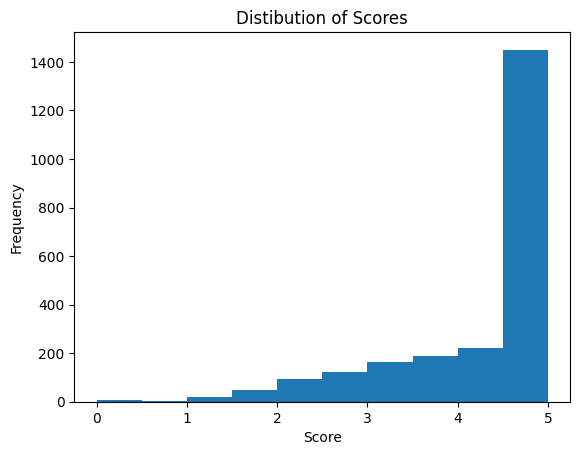

In [9]:
plt.hist(df['score'])
plt.xlabel('Score')
plt.ylabel('Frequency')
plt.title('Distibution of Scores')
plt.show()

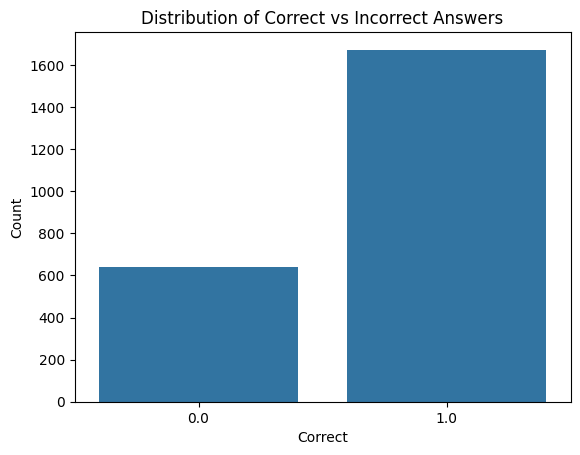

In [10]:
import seaborn as sns
sns.countplot(x='correct', data=df)
plt.xlabel('Correct')
plt.ylabel('Count')
plt.title('Distribution of Correct vs Incorrect Answers')
plt.show()

# Text Preprocessing

In [11]:
stop_words = set(sw.words('english'))
Lemmatizer = WordNetLemmatizer()
def preprocessing(text):
    tokens = word_tokenize(text)
    tokens = [token.lower() for token in tokens]
    tokens = [re.sub(r'[^\w\s]', '', token) for token in tokens if token not in string.punctuation]
    tokens = [token for token in tokens if token not in stop_words]
    tokens = [Lemmatizer.lemmatize(token) for token in tokens]
    return tokens

def join_tokens(tokens):
    return ' '.join(tokens)

## Discretization

In [12]:
bins = [0,2,3.5,4,6]
labels = ['very low', 'low', 'medium', 'high']
df['score_category'] = pd.cut(df['score'], bins=bins, labels=labels, right=False)

In [13]:

df['answer'] = df['answer'].apply(lambda x: preprocessing(x))
df['joined_tokens'] = df['answer'].apply(lambda x: join_tokens(x))

In [14]:
df

,id,answer,score,correct,score_category,joined_tokens
0,1.1,"[high, risk, problem, address, prototype, prog...",3.5,0.0,medium,high risk problem address prototype program ma...
1,1.1,"[simulate, portion, desired, final, product, q...",5.0,1.0,high,simulate portion desired final product quick e...
2,1.1,"[prototype, program, simulates, behavior, port...",4.0,1.0,high,prototype program simulates behavior portion d...
3,1.1,"[defined, specification, phase, prototype, sti...",5.0,1.0,high,defined specification phase prototype stimulat...
4,1.1,"[used, let, user, first, idea, completed, prog...",3.0,0.0,low,used let user first idea completed program all...
...,...,...,...,...,...,...
2436,12.1,"[three, step, visit, root, node, go, right, su...",2.5,0.0,low,three step visit root node go right subtree vi...
2438,12.1,"[minus, 1, divided, 2]",1.5,0.0,very low,minus 1 divided 2
2439,12.1,[2n1],2.5,0.0,low,2n1
2440,12.1,"[take, h, step, h, height, tree]",5.0,1.0,high,take h step h height tree


In [15]:
vocab_set = set()
for token_list in df['answer']:
    vocab_set.update(token_list)
vocab_size = len(vocab_set)
print("Vocabulary Size for our Corpus is:",vocab_size)

Vocabulary Size for our Corpus is: 2390


# Feature Engineering
## TF-IDF

In [16]:
tfidf = TfidfVectorizer()
result = tfidf.fit_transform(df['joined_tokens'])

In [17]:
vocab = tfidf.get_feature_names_out()
DocTermM = pd.DataFrame(data=result.toarray(), index = df.index, columns = vocab) 

In [18]:
DocTermM

,000000,012,0the,0x,10,100,115,123,12345,123456789,...,write,writing,written,xptr,yes,yet,yield,youre,zero,zillion
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2436,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2438,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2439,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2440,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [19]:
highest_tfidf_indices = DocTermM.idxmax(axis=1)

highest_tfidf_values = DocTermM.max(axis=1)

highest_tfidf_df = pd.DataFrame({'Highest_TFIDF_Word': highest_tfidf_indices, 'TFIDF_Value': highest_tfidf_values})
highest_tfidf_df


,Highest_TFIDF_Word,TFIDF_Value
0,prototype,0.345789
1,final,0.464638
2,simulates,0.357975
3,prototype,0.326737
4,project,0.476384
...,...,...
2436,subtree,0.653396
2438,divided,0.739985
2439,2n1,1.000000
2440,height,0.596552


## BAG OF WORD

In [20]:
cv = CountVectorizer()
metaresult = cv.fit_transform(df['joined_tokens'])
data_cv = pd.DataFrame(metaresult.toarray(), columns =cv.get_feature_names_out())

In [21]:
data_cv

,000000,012,0the,0x,10,100,115,123,12345,123456789,...,write,writing,written,xptr,yes,yet,yield,youre,zero,zillion
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2307,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2308,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2309,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2310,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [22]:
word_counts = data_cv.sum()

sorted_word_counts = word_counts.sort_values(ascending=False)
top_n_words = sorted_word_counts.head(10)
print(top_n_words)

function    693
array       617
list        506
element     459
node        420
data        352
pointer     288
first       254
variable    251
value       241
dtype: int64


# Word2Vec

## Word2Vec - Cbow

In [23]:
# Cbow by default
model1= gensim.models.Word2Vec(
    window = 6,
    min_count=1, 
    epochs=10,
)

implement word2vec by cbow technique by default sg=0

In [24]:
model1.build_vocab(df['answer'])
model1.corpus_count

2312

In [25]:
model1.train(df['answer'], total_examples = model1.corpus_count, epochs = model1.epochs)

(187416, 238560)

In [26]:
model1.wv.most_similar("height")

[('level', 0.9986856579780579),
 ('key', 0.9984956979751587),
 ('side', 0.9974554777145386),
 ('special', 0.9972749352455139),
 ('longest', 0.9970633387565613),
 ('larger', 0.9969061613082886),
 ('branch', 0.9963588714599609),
 ('le', 0.9961918592453003),
 ('comparison', 0.9960761666297913),
 ('greatest', 0.9955848455429077)]

In [27]:
vector = model1.wv.index_to_key

In [28]:
print(vector)

['function', 'array', 'list', 'element', 'node', 'data', 'pointer', 'first', 'variable', 'value', 'class', 'type', 'item', 'one', 'memory', 'linked', 'size', 'tree', 'n', 'program', 'stack', 'object', 'child', 'case', 'number', 'return', 'address', 'point', 'problem', 'member', 'queue', 'time', 'name', 'used', 'right', 'left', 'string', 'sort', 'last', 'two', 'set', 'constructor', 'end', 'order', '2', 'call', 'character', 'declared', 'base', 'plus', 'static', 'root', 'using', 'pop', 'push', 'power', 'take', 'code', 'use', 'loop', 'back', 'operation', 'parameter', 'sorted', 'head', 'structure', 'main', 'based', 'argument', 'also', '', 'contains', 'definition', 'top', 'called', 'constant', 'reference', 'stored', 'statement', 'access', 'would', 'next', '1', 'add', 'equal', 'prototype', 'must', 'binary', 'smaller', 'null', 'need', 'easier', '3', 'file', 'make', 'passed', 'front', 'compiler', 'search', 'find', 'put', 'local', 'remove', 'location', 'run', 'place', 'public', 'way', 'parent', 

In [29]:
for word in vector:
    result = model1.wv[word]
    print(f"Word : {word} : Result : {result}")

Word : function : Result : [ 0.13441159  0.6933177   0.21745743  0.05834233 -0.01319777 -0.46751457
  0.25909483  0.9120569  -0.55522215 -0.45745635  0.28412896 -0.23492515
  0.16029243 -0.098216    0.15933737  0.24684842  0.5186127  -1.3235354
 -0.62330794 -1.7911277  -0.00529213  0.7316821  -0.15946838  0.2632771
  0.12481333 -0.2046018   0.07471651 -0.45970163 -0.07681291  0.18284082
  0.5672622  -0.10620528  0.13645111  0.14367409 -0.364601    1.2349806
  0.4986989  -0.93755835 -0.16332087 -1.239908   -0.23480445 -0.4374999
 -0.19208798 -0.12823476  0.64483005 -0.13575967 -0.8674517   0.44863462
 -0.5078409   0.84209687 -0.14036945  0.07479574 -0.72486144  0.14721702
 -0.08790208 -0.20162164  0.08905515  0.01831429 -0.870629    0.06091403
  0.15946749 -0.50586563 -0.09678816 -0.5035629  -0.31788796  0.08292133
  0.24584343  0.05774411 -0.5403303   0.4788606  -0.46026045  0.571342
  0.24421716 -0.17804316 -0.02512011  0.21560425  0.08557034 -0.4943774
 -0.5232298   0.177343    0.549

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



## Word2Vec - Skipgram

In [30]:
model2= gensim.models.Word2Vec(
    df['answer'],
    window = 4,
    min_count= 1,
    epochs=10,
    sg=1 #implement skipgram
)

In [31]:
model2.build_vocab(df['answer'])

In [32]:
model2.train(df['answer'], total_examples = model2.corpus_count, epochs=model2.epochs)

(187128, 238560)

In [33]:
model2.wv.most_similar('height')

[('generation', 0.9602417349815369),
 ('maximum', 0.9589080810546875),
 ('visited', 0.9536934494972229),
 ('comparison', 0.9441928863525391),
 ('longest', 0.9432818293571472),
 ('path', 0.9398670196533203),
 ('binary', 0.9390115737915039),
 ('tree', 0.937717616558075),
 ('search', 0.9343949556350708),
 ('farthest', 0.9340110421180725)]

In [34]:
model2.wv.similarity('function', 'path')

0.4959026

In [35]:
vector2 = model2.wv.index_to_key

In [36]:
for word in vector2:
    result = model2.wv[word]
    print(f"word :{word}, result: {result}")

word :function, result: [ 1.83716297e-01  1.62290186e-01 -1.08231589e-01 -8.31261054e-02
 -2.46478453e-01 -3.82560164e-01 -1.67505533e-01  2.73127913e-01
 -1.49831623e-01 -1.36032462e-01  8.66895765e-02 -2.95269817e-01
 -2.18556114e-02 -1.68377489e-01 -1.73602715e-01 -7.26687983e-02
  2.92779624e-01 -6.22068942e-01  4.80006486e-02 -3.40373516e-01
  5.24236541e-03  2.20829189e-01  1.72005281e-01 -8.97391066e-02
  4.19655651e-01  1.77300081e-01  1.06925808e-01 -2.40791455e-01
  7.14130327e-02  2.02648595e-01  3.07719767e-01  2.10299179e-01
  6.44043684e-02 -2.32906565e-02  1.09327756e-01  5.27484119e-01
 -9.81495529e-02 -8.07250261e-01 -4.90743548e-01 -5.89155078e-01
  2.36934066e-01 -1.97323218e-01  9.85045806e-02  1.44893691e-01
  6.43013537e-01 -3.86537224e-01 -2.80376971e-01  4.07664590e-02
  8.00088793e-03  1.53898850e-01 -4.08874713e-02  2.08776474e-01
 -4.70365107e-01  3.60376537e-01 -1.96114685e-02  1.01468906e-01
  7.55590275e-02  3.88124213e-02 -3.11600983e-01 -2.73703772e-04
 

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [37]:
def tsne_plot():
    labels = []
    tokens = []
    
    # Extracting words and their vectors from our trained model 
    for word in model1.wv.index_to_key:
        tokens.append(model1.wv[word])
        labels.append(word)
    tokens = np.array(tokens)
    
    # Train t-SNE 
    tsne_model = TSNE(perplexity=45, n_components=2, init='pca', n_iter=2500, random_state=23)
    new_values = tsne_model.fit_transform(tokens)
    x = []
    y = []
    
    for value in new_values:
        x.append(value[0])
        y.append(value[1])
        
    plt.figure(figsize=(16, 16)) 
    for i in range(len(x)):
        plt.scatter(x[i],y[i])
        plt.annotate(labels[i],
                     xy=(x[i], y[i]),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
        plt.xlabel("dimension 1")
        plt.ylabel("dimension 2")
    plt.show()

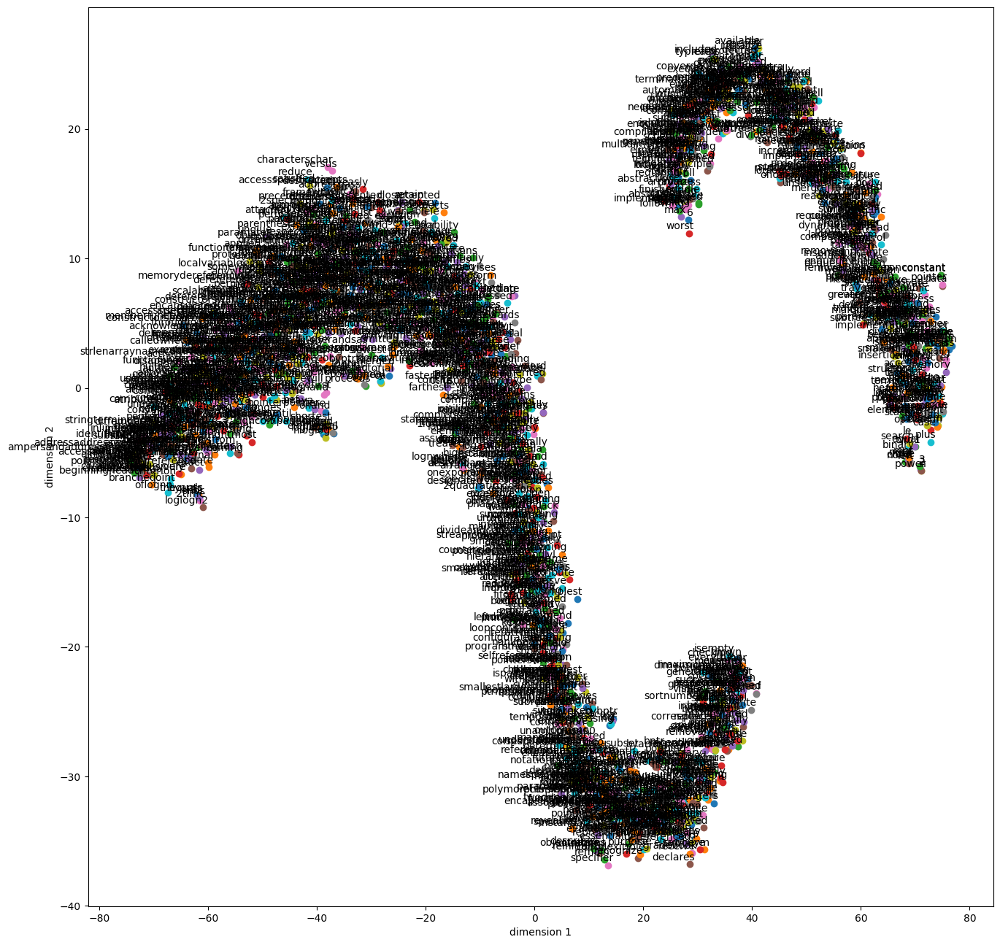

In [38]:
tsne_plot()

### to zoom in and hover over points to see word labels, which is useful when dealing with a large number of words

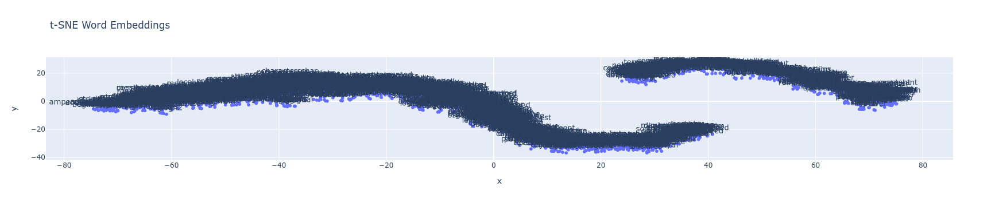

In [39]:
def tsne_plot_interactive(model):
    labels = []
    tokens = []
    
    # Extracting words and their vectors from our trained model 
    for word in model.wv.index_to_key:
        tokens.append(model.wv[word])
        labels.append(word)
    
    # Convert list of tokens to a numpy array
    tokens = np.array(tokens)
    
    # Train t-SNE 
    tsne_model = TSNE(perplexity=45, n_components=2, init='pca', n_iter=2500, random_state=23)
    new_values = tsne_model.fit_transform(tokens)
    
    df_tsne = pd.DataFrame(new_values, columns=['x', 'y'])
    df_tsne['word'] = labels
    
    fig = px.scatter(df_tsne, x='x', y='y', text='word', title='t-SNE Word Embeddings')
    fig.update_traces(textposition='top center')
    fig.show()

# Call the function with the trained model
tsne_plot_interactive(model1)


### visualizing the most relevant words

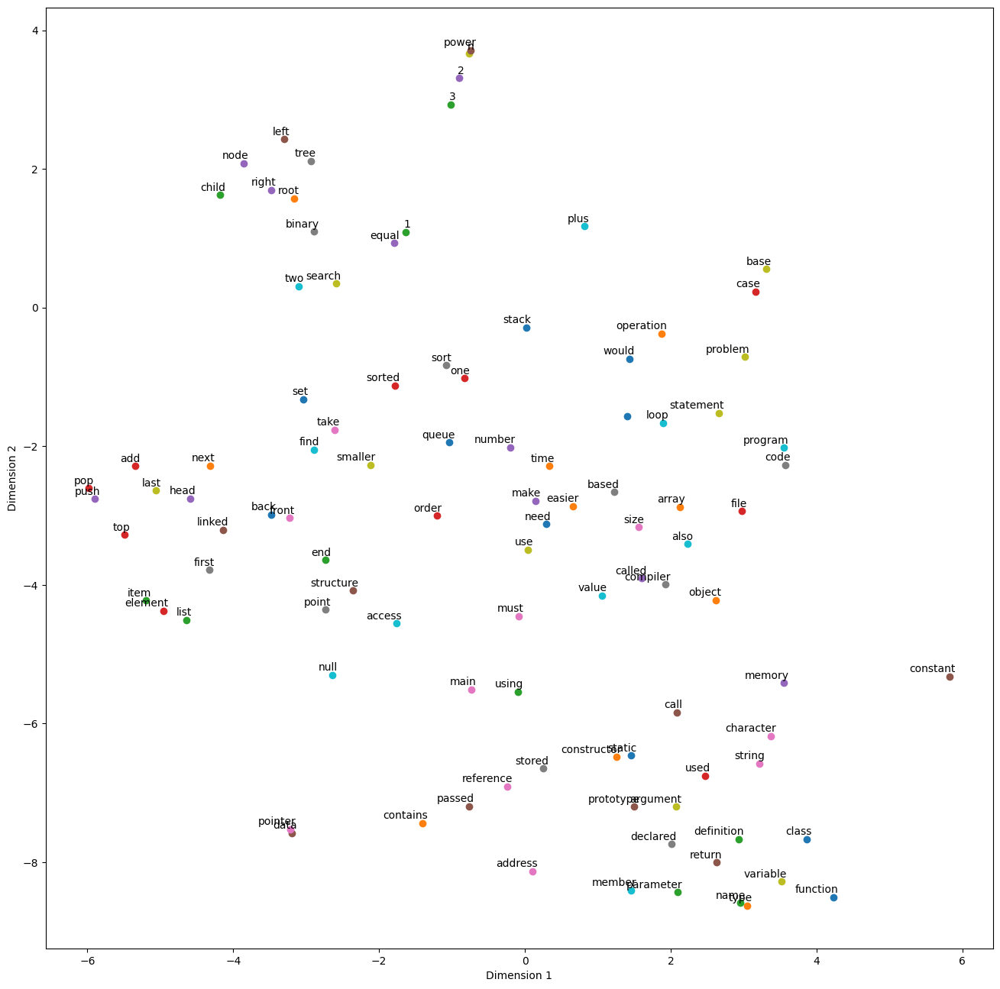

In [40]:
def tsne_plot_subsample(model, num_words=100):
    labels = []
    tokens = []
    
    # Extracting words and their vectors from our trained model 
    for word in model.wv.index_to_key[:num_words]:
        tokens.append(model.wv[word])
        labels.append(word)
    
    # Convert list of tokens to a numpy array
    tokens = np.array(tokens)
    
    # Train t-SNE 
    tsne_model = TSNE(perplexity=30, n_components=2, init='pca', n_iter=2500, random_state=23)
    new_values = tsne_model.fit_transform(tokens)
    
    x = []
    y = []
    
    for value in new_values:
        x.append(value[0])
        y.append(value[1])
        
    plt.figure(figsize=(16, 16)) 
    for i in range(len(x)):
        plt.scatter(x[i], y[i])
        plt.annotate(labels[i],
                     xy=(x[i], y[i]),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
        plt.xlabel("Dimension 1")
        plt.ylabel("Dimension 2")
    plt.show()

# Call the function with the trained model
tsne_plot_subsample(model1, num_words=100)


## Feature Vector Creation
Convert each document into a feature vector by averaging the Word2Vec vectors of the words in the document.

In [41]:
def document_vector(model, document):
    document = [model.wv[word] for word in document if word in model.wv]
    if document:
        return np.mean(document, axis= 0)
    else:
        return np.zeros(model.vector_size)

In [42]:
df['feature_vectorCBOW'] = df['answer'].apply(lambda x: document_vector(model1, x))
df['feature_vectorSKIPGRAM'] = df['answer'].apply(lambda x: document_vector(model2, x))

In [43]:
label_encoder = LabelEncoder()
df['score_category_encoded'] = label_encoder.fit_transform(df['score_category'])

In [44]:
df

,id,answer,score,correct,score_category,joined_tokens,feature_vectorCBOW,feature_vectorSKIPGRAM,score_category_encoded
0,1.1,"[high, risk, problem, address, prototype, prog...",3.5,0.0,medium,high risk problem address prototype program ma...,"[-0.039613247, 0.39179677, 0.1056572, 0.102946...","[-0.054728866, 0.32256493, -0.022011882, -0.06...",2
1,1.1,"[simulate, portion, desired, final, product, q...",5.0,1.0,high,simulate portion desired final product quick e...,"[-0.05690416, 0.3289605, 0.091328815, 0.095218...","[-0.053166848, 0.34678307, -0.010677822, -0.01...",0
2,1.1,"[prototype, program, simulates, behavior, port...",4.0,1.0,high,prototype program simulates behavior portion d...,"[-0.0568744, 0.3667793, 0.103082255, 0.1036549...","[0.0061395983, 0.3642477, -0.12263226, -0.0391...",0
3,1.1,"[defined, specification, phase, prototype, sti...",5.0,1.0,high,defined specification phase prototype stimulat...,"[-0.03350112, 0.31764486, 0.092679046, 0.08516...","[-0.020103965, 0.34043503, -0.04573628, -0.046...",0
4,1.1,"[used, let, user, first, idea, completed, prog...",3.0,0.0,low,used let user first idea completed program all...,"[-0.059687722, 0.28388906, 0.07622564, 0.09088...","[-0.09778885, 0.28722137, 0.056364376, 0.00970...",1
...,...,...,...,...,...,...,...,...,...
2436,12.1,"[three, step, visit, root, node, go, right, su...",2.5,0.0,low,three step visit root node go right subtree vi...,"[-0.17426838, 0.40877095, 0.07507133, 0.089421...","[-0.11438216, 0.43884405, -0.11593954, 0.12197...",1
2438,12.1,"[minus, 1, divided, 2]",1.5,0.0,very low,minus 1 divided 2,"[-0.12563416, 0.4257086, 0.04228835, 0.1098363...","[-0.1155037, 0.4016961, 0.15685803, 0.2693718,...",3
2439,12.1,[2n1],2.5,0.0,low,2n1,"[-0.0014804613, 0.009087482, 0.0055694426, -0....","[-0.009442375, 0.11903822, 0.01488546, -0.0013...",1
2440,12.1,"[take, h, step, h, height, tree]",5.0,1.0,high,take h step h height tree,"[-0.12802583, 0.40024653, 0.099632286, 0.09829...","[-0.08961194, 0.3027056, 0.13972756, 0.0885890...",0


The purpose of averaging word vectors to create a single document vector is to transform variable-length text data into a fixed-length numerical representation. This transformation makes it possible to use traditional machine learning algorithms, like linear regression,SVR, Naive Bayes,  Decision Tree Algorithms

# Modeling

## Train Models

In [45]:
'''the purpose of using vstack is to converting the list of arrayof feature 'feature_vector' to 2D array 
because machine laerning models such as thos from scikit-learn
expect the input features to be in from of a 2D array'''
features = np.vstack(df['feature_vectorSKIPGRAM'])
features = np.hstack((features, df['score_category_encoded'].values.reshape(-1, 1), df['id'].values.reshape(-1, 1), df['correct'].values.reshape(-1,1)))
target = df['score']
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=24)

In [46]:
models = {
    'Linear Regression' : LinearRegression(),
    'SVR' : SVR(),
    'Decision Tree' : DecisionTreeRegressor()
}

### Train the models and store them in a dictionary

In [47]:
trained_model = {}
for model_name, model in models.items():
    model.fit(X_train, y_train)
    trained_model[model_name] = model

# Regression models evaluation metrics
1. Mean Squared Error (MSE)
2. RMSE
3. R2 Score

In [48]:
def evaluate_model(model, X_test, y_test):
    predictions = model.predict(X_test)
    mse = mean_squared_error(y_test, predictions)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, predictions)
    return mse, rmse, r2

In [49]:
results = []
for model_name, model in trained_model.items():
    mse, rmse, r2 = evaluate_model(model, X_test, y_test)
    results.append({'Model': model_name, 'MSE': mse, 'RMSE':rmse, 'R2 Score': r2})

In [50]:
result_df = pd.DataFrame(data = results)
markdown_table = result_df.to_markdown()

print(markdown_table)


|    | Model             |      MSE |     RMSE |   R2 Score |
|---:|:------------------|---------:|---------:|-----------:|
|  0 | Linear Regression | 0.237753 | 0.487599 |   0.788641 |
|  1 | SVR               | 0.260376 | 0.510271 |   0.768529 |
|  2 | Decision Tree     | 0.208146 | 0.45623  |   0.814961 |


### R2 Score: 
        The Decision Tree model has the highest R2 score (0.820331), indicating it explains the most variance in the target variable. Higher R2 scores mean a better fit to the data.

### MSE and RMSE: 
        While the Decision Tree has a slightly higher MSE (0.202105) and RMSE (0.449561) compared to Linear Regression, the difference is relatively small. The Decision Tree's higher R2 score suggests a better overall performance.

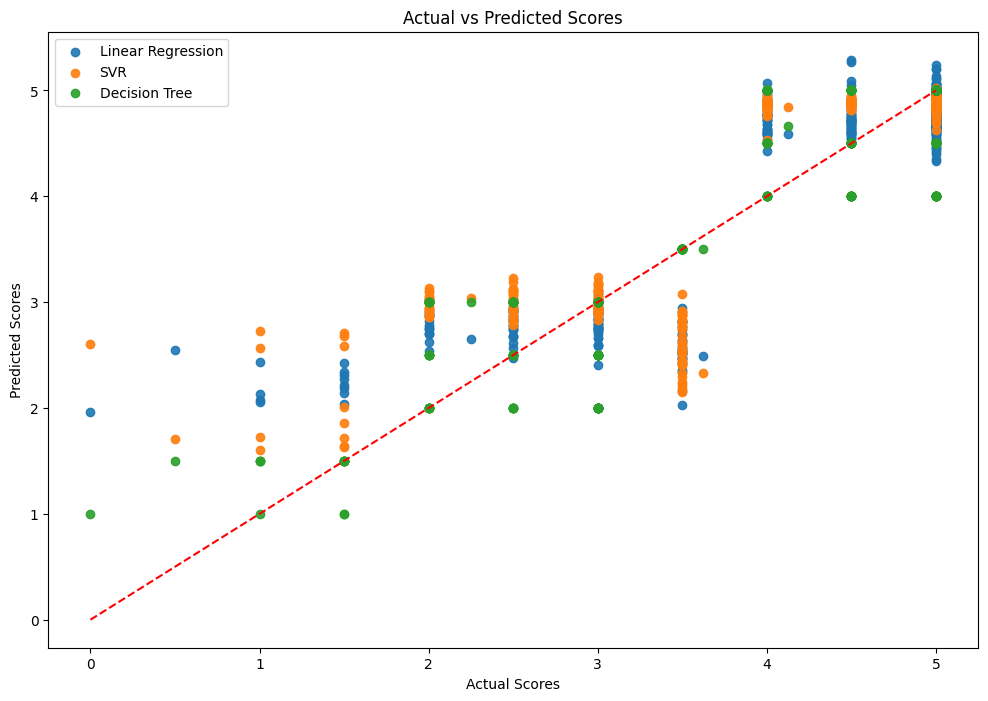

In [51]:
y_preds = {}
for model_name , model in trained_model.items():
    y_preds[model_name]=model.predict(X_test)

plt.figure(figsize=(12,8))
for model_name, y_pred in y_preds.items():
    plt.scatter(y_test, y_pred, alpha =0.9, label = model_name)
plt.plot([0, max(y_test)], [0, max(y_test)], color='red', linestyle='--')  # Diagonal line
plt.title('Actual vs Predicted Scores')
plt.xlabel('Actual Scores')
plt.ylabel('Predicted Scores')
plt.legend()
plt.show()


### The scatter plot shows that the Decision Tree predictions (green dots) are generally closer to the ideal 45-degree line representing perfect prediction. This implies a stronger correlation between actual and predicted scores compared to the other models.

# Conclusion

    the Decision Tree model appears to be the most suitable for this particular task, followed by Linear Regression. SVR, while not performing poorly, does not seem to capture the underlying patterns in the data as effectively as the other models.